# Multiclass Classification torch RoBERTa

In [10]:
!pip install chardet contractions
debug = False
debug2 = False

import numpy as np 
import pandas as pd 
import os
import re
import contractions
from sklearn.metrics import accuracy_score, f1_score
from sklearn.model_selection import StratifiedKFold, train_test_split
from sklearn.preprocessing import LabelEncoder
import torch
import torch.nn as nn
from torch.utils.data import DataLoader, Dataset
from tqdm import tqdm
import matplotlib.pyplot as plt 
import transformers
import random
import chardet
import warnings
warnings.simplefilter('ignore')

# Initialize GPU settings
scaler = torch.cuda.amp.GradScaler() 
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

# Set random seed
def random_seed(SEED):
    random.seed(SEED)
    os.environ['PYTHONHASHSEED'] = str(SEED)
    np.random.seed(SEED)
    torch.manual_seed(SEED)
    torch.cuda.manual_seed(SEED)
    torch.cuda.manual_seed_all(SEED)
    torch.backends.cudnn.deterministic = True
    
SEED = 508
random_seed(SEED)

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 289.9/289.9 kB 6.5 MB/s eta 0:00:0000:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 110.7/110.7 kB 9.2 MB/s eta 0:00:00


In [11]:
# ----------------- DATA PREPROCESSING -----------------
def fix_contractions(text):
    return contractions.fix(text)

def clean_text(text):
    text = re.sub(r'[^a-zA-Z0-9\s]', '', text)
    return text

# Load and preprocess data
train_data = pd.read_csv('/kaggle/input/kuc-hackathon-winter-2018/drugsComTrain_raw.csv')
test_data = pd.read_csv('/kaggle/input/kuc-hackathon-winter-2018/drugsComTest_raw.csv')

# Keep relevant columns and clean
for df in [train_data, test_data]:
    df['review'] = df['review'].apply(fix_contractions)
    df['review'] = df['review'].str.lower()
    df['review'] = df['review'].apply(clean_text)

# Filter conditions with sufficient data
review_counts = train_data['condition'].value_counts().reset_index()
review_counts.columns = ['condition', 'count']
valid_conditions = review_counts[review_counts['count'] > 3000]['condition'].tolist()

train_data = train_data[train_data['condition'].isin(valid_conditions)]
test_data = test_data[test_data['condition'].isin(valid_conditions)]

# Encode labels
label_encoder = LabelEncoder()
train_data['label'] = label_encoder.fit_transform(train_data['condition'])
test_data['label'] = label_encoder.transform(test_data['condition'])
num_classes = len(label_encoder.classes_)

# Split data
train, valid = train_test_split(train_data, test_size=0.2, random_state=42)

valid_conditions

['Birth Control',
 'Depression',
 'Pain',
 'Anxiety',
 'Acne',
 'Bipolar Disorde',
 'Insomnia',
 'Weight Loss',
 'Obesity',
 'ADHD']

In [3]:
df['review'][10:]

10       holy hell is exactly how i feel i had been tak...
11       honestly its day one on the 3 day treatment ye...
12       this is a waste of money  did not curb my appe...
13                          no problems watch what you eat
14       ditto on rebound sleepless when discontinued i...
                               ...                        
53761    i have taken tamoxifen for 5 years side effect...
53762    i039ve been taking lexapro escitaploprgram sin...
53763    i039m married 34 years old and i have no kids ...
53764    i was prescribed nucynta for severe neckshould...
53765                                             it works
Name: review, Length: 53756, dtype: object

In [4]:
# ----------------- MODEL SETUP -----------------
tokenizer = transformers.RobertaTokenizer.from_pretrained("roberta-base")
max_sens = 256

class MedicalDataset(Dataset):
    def __init__(self, texts, labels):
        self.texts = texts
        self.labels = labels
        
    def __len__(self):
        return len(self.texts)
    
    def __getitem__(self, idx):
        encoding = tokenizer.encode_plus(
            self.texts[idx],
            add_special_tokens=True,
            max_length=max_sens,
            padding='max_length',
            truncation=True,
            return_attention_mask=True
        )
        return {
            'ids': torch.tensor(encoding['input_ids'], dtype=torch.long),
            'mask': torch.tensor(encoding['attention_mask'], dtype=torch.long),
            'targets': torch.tensor(self.labels[idx], dtype=torch.long)
        }

# Create datasets and dataloaders
train_dataset = MedicalDataset(train['review'].values, train['label'].values)
valid_dataset = MedicalDataset(valid['review'].values, valid['label'].values)
test_dataset = MedicalDataset(test_data['review'].values, test_data['label'].values)

train_loader = DataLoader(train_dataset, batch_size=16, shuffle=True, num_workers=4)
valid_loader = DataLoader(valid_dataset, batch_size=32, shuffle=False, num_workers=4)
test_loader = DataLoader(test_dataset, batch_size=32, shuffle=False, num_workers=4)

# Initialize model
model = transformers.RobertaForSequenceClassification.from_pretrained("roberta-base", num_labels=num_classes)
model.to(device)

tokenizer_config.json:   0%|          | 0.00/25.0 [00:00<?, ?B/s]

vocab.json:   0%|          | 0.00/899k [00:00<?, ?B/s]

merges.txt:   0%|          | 0.00/456k [00:00<?, ?B/s]

tokenizer.json:   0%|          | 0.00/1.36M [00:00<?, ?B/s]

config.json:   0%|          | 0.00/481 [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/499M [00:00<?, ?B/s]

Some weights of RobertaForSequenceClassification were not initialized from the model checkpoint at roberta-base and are newly initialized: ['classifier.dense.bias', 'classifier.dense.weight', 'classifier.out_proj.bias', 'classifier.out_proj.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


RobertaForSequenceClassification(
  (roberta): RobertaModel(
    (embeddings): RobertaEmbeddings(
      (word_embeddings): Embedding(50265, 768, padding_idx=1)
      (position_embeddings): Embedding(514, 768, padding_idx=1)
      (token_type_embeddings): Embedding(1, 768)
      (LayerNorm): LayerNorm((768,), eps=1e-05, elementwise_affine=True)
      (dropout): Dropout(p=0.1, inplace=False)
    )
    (encoder): RobertaEncoder(
      (layer): ModuleList(
        (0-11): 12 x RobertaLayer(
          (attention): RobertaAttention(
            (self): RobertaSdpaSelfAttention(
              (query): Linear(in_features=768, out_features=768, bias=True)
              (key): Linear(in_features=768, out_features=768, bias=True)
              (value): Linear(in_features=768, out_features=768, bias=True)
              (dropout): Dropout(p=0.1, inplace=False)
            )
            (output): RobertaSelfOutput(
              (dense): Linear(in_features=768, out_features=768, bias=True)
         

In [5]:
# ----------------- TRAINING SETUP -----------------

optimizer = transformers.AdamW(model.parameters(), lr=2e-5)
loss_fn = nn.CrossEntropyLoss()

epochs = 10 if not debug else 1
total_steps = len(train_loader) * epochs
scheduler = transformers.get_linear_schedule_with_warmup(optimizer, 
                                                        num_warmup_steps=0,
                                                        num_training_steps=total_steps)

# ----------------- TRAINING FUNCTIONS -----------------
def train_epoch(model, dataloader):
    model.train()
    total_loss = 0
    all_preds = []
    all_labels = []
    
    for batch in dataloader:
        optimizer.zero_grad()
        
        inputs = {
            'input_ids': batch['ids'].to(device),
            'attention_mask': batch['mask'].to(device),
            'labels': batch['targets'].to(device)
        }
        
        with torch.cuda.amp.autocast():
            outputs = model(**inputs)
            loss = outputs.loss
        
        scaler.scale(loss).backward()
        scaler.step(optimizer)
        scaler.update()
        scheduler.step()
        
        total_loss += loss.item()
        preds = torch.argmax(outputs.logits, dim=1)
        all_preds.extend(preds.cpu().numpy())
        all_labels.extend(inputs['labels'].cpu().numpy())
    
    avg_loss = total_loss / len(dataloader)
    accuracy = accuracy_score(all_labels, all_preds)
    f1 = f1_score(all_labels, all_preds, average='weighted')
    return avg_loss, accuracy, f1

def validate(model, dataloader):
    model.eval()
    total_loss = 0
    all_preds = []
    all_labels = []
    
    with torch.no_grad():
        for batch in dataloader:
            inputs = {
                'input_ids': batch['ids'].to(device),
                'attention_mask': batch['mask'].to(device),
                'labels': batch['targets'].to(device)
            }
            
            outputs = model(**inputs)
            loss = outputs.loss
            total_loss += loss.item()
            
            preds = torch.argmax(outputs.logits, dim=1)
            all_preds.extend(preds.cpu().numpy())
            all_labels.extend(inputs['labels'].cpu().numpy())
    
    avg_loss = total_loss / len(dataloader)
    accuracy = accuracy_score(all_labels, all_preds)
    f1 = f1_score(all_labels, all_preds, average='weighted')
    return avg_loss, accuracy, f1

In [12]:
def get_recommendations(predicted_conditions, full_data, label_encoder, min_rating=8, top_n=5):
    """
    Generate drug recommendations for predicted conditions based on aggregated metrics.
    
    Args:
        predicted_conditions (list): List of predicted condition indices.
        full_data (pd.DataFrame): Full dataset containing drug reviews.
        label_encoder: Label encoder used to map condition indices to names.
        min_rating (int): Minimum rating to consider a review positive.
        top_n (int): Number of top drugs to recommend per condition.
        
    Returns:
        list: Recommendations for each condition, including drug details or messages.
    """
    recommendations = []
    
    for condition in predicted_conditions:
        # Decode the condition name
        condition_name = label_encoder.inverse_transform([condition])[0]
        condition_data = full_data[full_data['condition'] == condition_name]
        
        if condition_data.empty:
            # Handle case where no data exists for the condition
            recommendations.append({
                'condition': condition_name,
                'message': "No data available"
            })
            continue
        
        # Filter for high-rated drugs (rating >= min_rating)
        high_rated = condition_data[condition_data['rating'] >= min_rating]
        
        if high_rated.empty:
            # Handle case where no high-rated drugs exist for the condition
            recommendations.append({
                'condition': condition_name,
                'message': f"No drugs with rating >= {min_rating} available"
            })
            continue
        
        # Aggregate drug data: group by drugName and calculate metrics
        aggregated = high_rated.groupby('drugName').agg(
            num_reviews=('rating', 'size'),       # Total number of reviews
            avg_rating=('rating', 'mean'),        # Average rating
            total_useful=('usefulCount', 'sum')   # Total useful votes
        ).reset_index()
        
        # Sort by total_useful (primary) and avg_rating (secondary)
        recommended = aggregated.sort_values(
            by=['total_useful', 'avg_rating'], ascending=False
        ).head(top_n)
        
        # Append recommendations
        if not recommended.empty:
            num_recommended = len(recommended)
            recommendations.append({
                'condition': condition_name,
                'drugs': recommended[['drugName', 'avg_rating', 'total_useful']].to_dict(orient='records'),
                'mean_rating': recommended['avg_rating'].mean(),
                'total_options': num_recommended,
                'message': f"Only {num_recommended} drug(s) meet the recommendation criteria."
            })
        else:
            recommendations.append({
                'condition': condition_name,
                'message': "No drugs meet the recommendation criteria"
            })
    
    return recommendations

In [7]:
best_val_loss = float('inf')
patience = 3  # Stop if validation loss doesn't improve for 3 epochs
patience_counter = 0

for epoch in range(epochs):
    train_loss, train_acc, train_f1 = train_epoch(model, train_loader)
    val_loss, val_acc, val_f1 = validate(model, valid_loader)
    
    print(f"Epoch {epoch+1}/{epochs}")
    print(f"Train Loss: {train_loss:.4f} | Acc: {train_acc:.4f} | F1: {train_f1:.4f}")
    print(f"Val Loss: {val_loss:.4f} | Acc: {val_acc:.4f} | F1: {val_f1:.4f}")
    
    if val_loss < best_val_loss:
        best_val_loss = val_loss
        patience_counter = 0
        torch.save(model.state_dict(), "best_model.pth")  # Save the best model
    else:
        patience_counter += 1
    
    if patience_counter >= patience:
        print("Early stopping triggered!")
        break

Epoch 1/10
Train Loss: 0.4530 | Acc: 0.8360 | F1: 0.8350
Val Loss: 0.3134 | Acc: 0.8870 | F1: 0.8859
Epoch 2/10
Train Loss: 0.2907 | Acc: 0.8904 | F1: 0.8901
Val Loss: 0.2880 | Acc: 0.8974 | F1: 0.8969
Epoch 3/10
Train Loss: 0.2220 | Acc: 0.9150 | F1: 0.9148
Val Loss: 0.2758 | Acc: 0.9068 | F1: 0.9055
Epoch 4/10
Train Loss: 0.1684 | Acc: 0.9361 | F1: 0.9359
Val Loss: 0.2559 | Acc: 0.9181 | F1: 0.9176
Epoch 5/10
Train Loss: 0.1267 | Acc: 0.9517 | F1: 0.9516
Val Loss: 0.2602 | Acc: 0.9212 | F1: 0.9208
Epoch 6/10
Train Loss: 0.0904 | Acc: 0.9659 | F1: 0.9659
Val Loss: 0.2629 | Acc: 0.9268 | F1: 0.9267
Epoch 7/10
Train Loss: 0.0664 | Acc: 0.9761 | F1: 0.9761
Val Loss: 0.2834 | Acc: 0.9308 | F1: 0.9307
Early stopping triggered!


In [8]:
# ----------------- EVALUATION -----------------

model.load_state_dict(torch.load("best_model.pth"))
test_loss, test_acc, test_f1 = validate(model, test_loader)




In [9]:
print("\nFinal Test Results:")
print(f"Test Loss: {test_loss:.4f} | Acc: {test_acc:.4f} | F1: {test_f1:.4f}")


Final Test Results:
Test Loss: 0.2496 | Acc: 0.9166 | F1: 0.9162


In [10]:
!pip install joblib
import joblib
# Load the saved model
model_path = "best_model.pth"  # Path to the saved model
model = transformers.RobertaForSequenceClassification.from_pretrained("roberta-base", num_labels=num_classes)
model.load_state_dict(torch.load(model_path))
model.to(device)
model.eval()  # Set the model to evaluation mode

# ====================== saving ======================
model.save_pretrained("roberta-disease-classifier")  
tokenizer.save_pretrained("roberta-disease-classifier")
joblib.dump(label_encoder, "label_encoder.pkl")

# Save drug data with relevant columns
drug_data = pd.concat([train_data, test_data])[['condition', 'drugName', 'rating', 'usefulCount']]
drug_data.to_csv("drug_recommendation_data.csv", index=False)

Some weights of RobertaForSequenceClassification were not initialized from the model checkpoint at roberta-base and are newly initialized: ['classifier.dense.bias', 'classifier.dense.weight', 'classifier.out_proj.bias', 'classifier.out_proj.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


In [18]:
def predict_disease(review, model, tokenizer, label_encoder):
    """
    Predict the disease for a given review.
    
    Args:
        review (str): The input review text.
        model: The trained model.
        tokenizer: The tokenizer used for preprocessing.
        label_encoder: The label encoder for decoding predictions.
    
    Returns:
        str: The predicted disease.
    """
    # Tokenize the input review
    inputs = tokenizer(
        review,
        add_special_tokens=True,
        max_length=256,
        padding='max_length',
        truncation=True,
        return_tensors='pt'
    )
    
    # Move inputs to the device
    inputs = {key: value.to(device) for key, value in inputs.items()}
    
    # Make predictions
    with torch.no_grad():
        outputs = model(**inputs)
        logits = outputs.logits
        preds = torch.argmax(logits, dim=1).cpu().numpy()
    
    # Decode the predicted label
    predicted_disease = label_encoder.inverse_transform(preds)[0]
    return predicted_disease

In [4]:
import torch
import transformers
import pandas as pd
import joblib

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

def predict_and_recommend(text, model, tokenizer, label_encoder, drug_df, top_n=3):
    try:
        # Preprocess input
        cleaned_text = clean_text(fix_contractions(text.lower()))
        print(f"Cleaned Text: {cleaned_text}")  # Debugging
        
        # Tokenize
        inputs = tokenizer(
            cleaned_text,
            max_length=256,
            padding='max_length',
            truncation=True,
            return_tensors='pt'
        ).to(device)
        
        # Predict
        with torch.no_grad():
            outputs = model(**inputs)
        
        if not hasattr(outputs, "logits"):
            raise ValueError("Model output does not contain 'logits'")

        pred_idx = torch.argmax(outputs.logits).item()
        print(f"Predicted Index: {pred_idx}")  # Debugging
        
        # Decode prediction
        condition = label_encoder.inverse_transform([pred_idx])[0]
        print(f"Predicted Condition: {condition}")  # Debugging
        
        # Get recommendations
        rec_df = recommend_drugs(condition, drug_df, top_n)

        return {
            'condition': condition,
            'drugs': rec_df.to_dict('records') if not rec_df.empty else [],
            'message': rec_df['message'].iloc[0] if 'message' in rec_df.columns else ''
        }
        
    except Exception as e:
        print(f"Error: {str(e)}")  # Print the error for debugging
        return {'error': str(e)}


In [15]:
import transformers

model = transformers.RobertaForSequenceClassification.from_pretrained("/kaggle/working/roberta-disease-classifier").to(device)
tokenizer = transformers.RobertaTokenizer.from_pretrained("/kaggle/working/roberta-disease-classifier")
label_encoder = joblib.load("/kaggle/working/label_encoder.pkl")
drug_df = pd.read_csv("drug_recommendation_data.csv")


# Sample reviews for testing
sample_reviews = [
    # Birth Control
    "I've been using oral contraceptives for 3 months and experienced mild nausea initially but it subsided after the first month.",
    # Depression
    "I've been feeling persistently sad and lost interest in activities I used to enjoy for the past 6 weeks.",
    # Pain
    "Sharp lower back pain that radiates to my legs, especially after sitting for long periods.",
    # Anxiety
    "Constant worrying about everyday things, difficulty concentrating, and restless sleep.",
    # Acne
    "Persistent facial breakouts with oily skin and occasional cystic acne on chin area.",
    # Bipolar Disorder
    "Periods of extreme energy and productivity followed by weeks of deep depression and lethargy.",
    # Insomnia
    "Difficulty falling asleep despite feeling tired, waking up multiple times during the night.",
    # Weight Loss
    "Struggling to lose weight despite calorie restriction and regular exercise.",
    # Obesity
    "BMI of 32 with difficulty managing weight due to hormonal issues and slow metabolism.",
    # ADHD
    "Trouble focusing on tasks, easily distracted, and frequently losing important items.",
]


# Test all sample reviews
print("\n" + "="*40 + " TEST RESULTS " + "="*40)
for idx, review in enumerate(sample_reviews):
    result = predict_and_recommend(review, model, tokenizer, label_encoder, drug_df)
    print(f"\nTest Case {idx+1}:")
    print(f"Input: {review[:80]}...")
    print(f"Predicted Condition: {result}")
    


======================================== TEST RESULTS ========================================
Cleaned Text: i have been using oral contraceptives for 3 months and experienced mild nausea initially but it subsided after the first month
Predicted Index: 4
Predicted Condition: Birth Control

Test Case 1:
Input: I've been using oral contraceptives for 3 months and experienced mild nausea ini...
Predicted Condition: {'condition': 'Birth Control', 'drugs': [{'drugName': 'Etonogestrel', 'num_reviews': 1826, 'avg_rating': 9.233844468784227, 'total_usefulness': 16193}, {'drugName': 'Levonorgestrel', 'num_reviews': 1686, 'avg_rating': 9.268683274021353, 'total_usefulness': 16524}, {'drugName': 'Ethinyl estradiol / norethindrone', 'num_reviews': 1283, 'avg_rating': 9.161340607950116, 'total_usefulness': 13832}], 'message': ''}
Cleaned Text: i have been feeling persistently sad and lost interest in activities i used to enjoy for the past 6 weeks
Predicted Index: 5
Predicted Condition: Depression

In [14]:
def recommend_drugs(predicted_disease, df, top_n=5):
    """
    Recommend top drugs for a predicted disease based on positive reviews.
    
    Args:
        predicted_disease (str): The predicted disease.
        df (pd.DataFrame): The dataset containing drug reviews.
        top_n (int): Number of top drugs to recommend.
    
    Returns:
        pd.DataFrame: Top N drugs with the most positive reviews and highest ratings.
    """
    # Filter the dataset for the predicted disease
    condition_df = df[df['condition'] == predicted_disease]
    
    # Filter for positive reviews (e.g., rating >= 8)
    positive_reviews_df = condition_df[condition_df['rating'] >= 8]
    
    if positive_reviews_df.empty:
        return pd.DataFrame({
            'message': [f"No high-rated drugs available for condition: {predicted_disease}"]
        })
    
    # Group by drug and calculate the number of positive reviews and average rating
    drug_stats = positive_reviews_df.groupby('drugName').agg(
        num_reviews=('rating', 'size'),  # Count the number of reviews
        avg_rating=('rating', 'mean'),   # Calculate the average rating
        total_usefulness=('usefulCount', 'sum')  # Sum the usefulness counts
    ).reset_index()
    
    # Sort by number of reviews, average rating, and total usefulness
    drug_stats = drug_stats.sort_values(
        by=['num_reviews', 'avg_rating', 'total_usefulness'],
        ascending=False
    )
    
    # Return the top N drugs
    return drug_stats.head(top_n)

In [19]:
# Sample reviews for testing
sample_reviews = [
    # Birth Control
    "I've been using oral contraceptives for 3 months and experienced mild nausea initially but it subsided after the first month.",
    # Depression
    "I've been feeling persistently sad and lost interest in activities I used to enjoy for the past 6 weeks.",
    # Pain
    "Sharp lower back pain that radiates to my legs, especially after sitting for long periods.",
    # Anxiety
    "Constant worrying about everyday things, difficulty concentrating, and restless sleep.",
    # Acne
    "Persistent facial breakouts with oily skin and occasional cystic acne on chin area.",
    # Bipolar Disorder
    "Periods of extreme energy and productivity followed by weeks of deep depression and lethargy.",
    # Insomnia
    "Difficulty falling asleep despite feeling tired, waking up multiple times during the night.",
    # Weight Loss
    "Struggling to lose weight despite calorie restriction and regular exercise.",
    # Obesity
    "BMI of 32 with difficulty managing weight due to hormonal issues and slow metabolism.",
    # ADHD
    "Trouble focusing on tasks, easily distracted, and frequently losing important items.",
]

# Load the dataset for drug recommendations
df = pd.read_csv('/kaggle/input/kuc-hackathon-winter-2018/drugsComTrain_raw.csv')

# Test the model
for review in sample_reviews:
    # Predict the disease
    predicted_disease = predict_disease(review, model, tokenizer, label_encoder)
    print(f"Review: {review}")
    print(f"Predicted Disease: {predicted_disease}")
    
    # Recommend drugs
    recommendations = recommend_drugs(predicted_disease, df, top_n=3)
    print("Recommended Drugs:")
    print(recommendations)
    print("\n" + "="*50 + "\n")

Review: I've been using oral contraceptives for 3 months and experienced mild nausea initially but it subsided after the first month.
Predicted Disease: Birth Control
Recommended Drugs:
                             drugName  num_reviews  avg_rating  \
41                       Etonogestrel         1367    9.232626   
66                     Levonorgestrel         1253    9.264166   
38  Ethinyl estradiol / norethindrone          985    9.153299   

    total_usefulness  
41             11407  
66             11818  
38             10030  


Review: I've been feeling persistently sad and lost interest in activities I used to enjoy for the past 6 weeks.
Predicted Disease: Depression
Recommended Drugs:
      drugName  num_reviews  avg_rating  total_usefulness
14   Bupropion          358    9.198324             25749
80  Sertraline          281    9.217082             18988
66     Pristiq          263    9.167300             12924


Review: Sharp lower back pain that radiates to my legs, esp

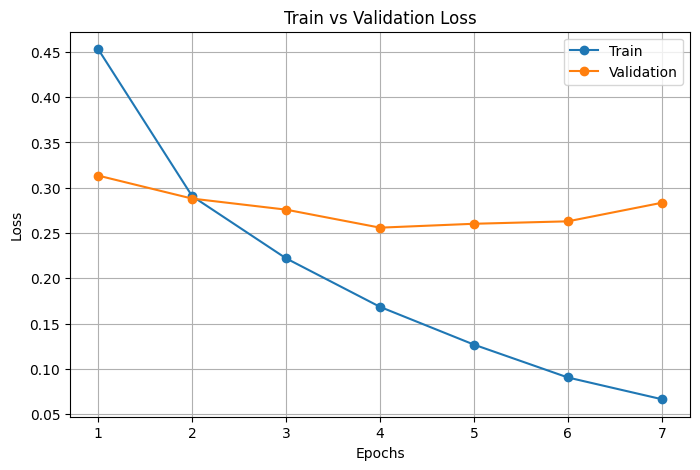

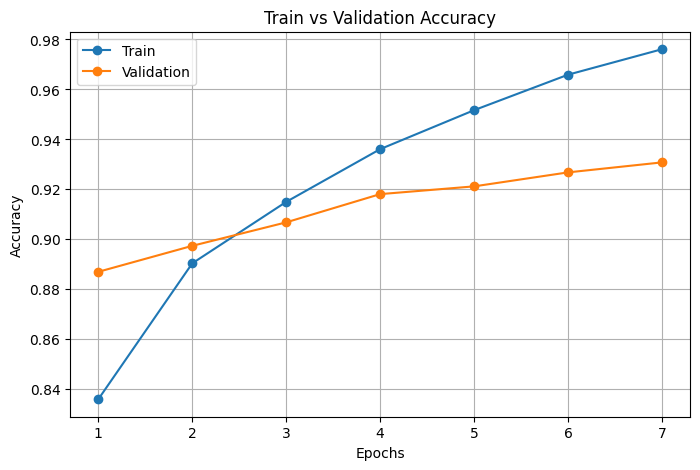

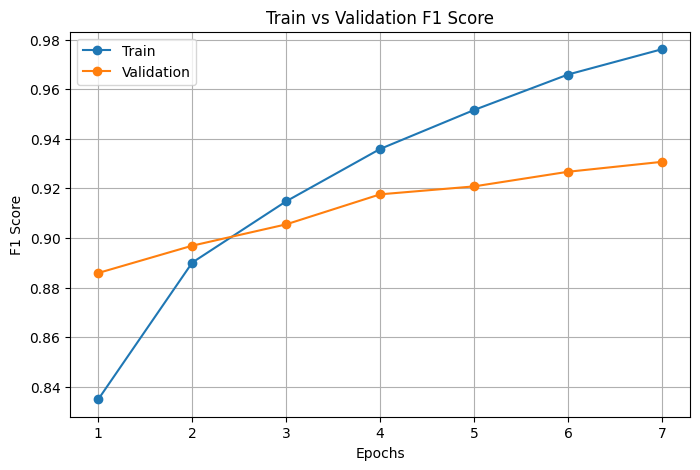

In [36]:
import matplotlib.pyplot as plt
import numpy as np

# Extracted loss and accuracy values
epochs = [1, 2, 3, 4, 5, 6, 7]
train_loss = [0.4530, 0.2907, 0.2220, 0.1684, 0.1267, 0.0904, 0.0664]
valid_loss = [0.3134, 0.2880, 0.2758, 0.2559, 0.2602, 0.2629, 0.2834]

train_acc = [0.8360, 0.8904, 0.9150, 0.9361, 0.9517, 0.9659, 0.9761]
valid_acc = [0.8870, 0.8974, 0.9068, 0.9181, 0.9212, 0.9268, 0.9308]

train_f1 = [0.8350, 0.8901, 0.9148, 0.9359, 0.9516, 0.9659, 0.9761]
valid_f1 = [0.8859, 0.8969, 0.9055, 0.9176, 0.9208, 0.9267, 0.9307]

# Function to plot graphs
def plot_metrics(epochs, train_metric, valid_metric, title, ylabel):
    plt.figure(figsize=(8, 5))
    plt.plot(epochs, train_metric, marker='o', linestyle='-', label='Train')
    plt.plot(epochs, valid_metric, marker='o', linestyle='-', label='Validation')
    plt.title(title)
    plt.xlabel("Epochs")
    plt.ylabel(ylabel)
    plt.legend()
    plt.grid(True)
    plt.show()

# Plot Loss
plot_metrics(epochs, train_loss, valid_loss, "Train vs Validation Loss", "Loss")

# Plot Accuracy
plot_metrics(epochs, train_acc, valid_acc, "Train vs Validation Accuracy", "Accuracy")

# Plot F1 Score
plot_metrics(epochs, train_f1, valid_f1, "Train vs Validation F1 Score", "F1 Score")


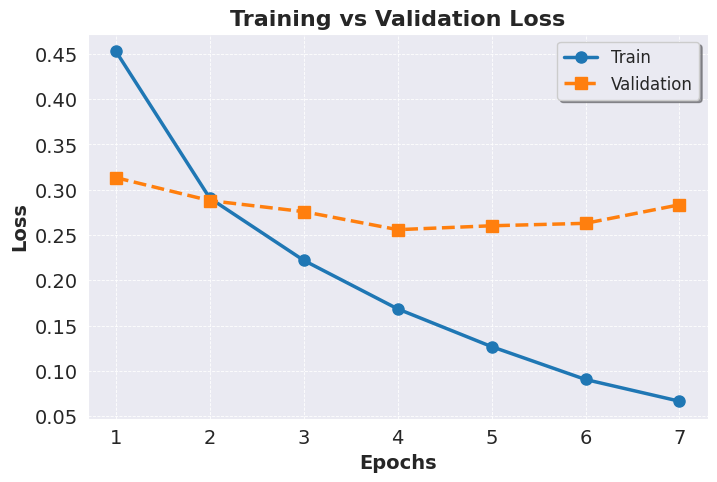

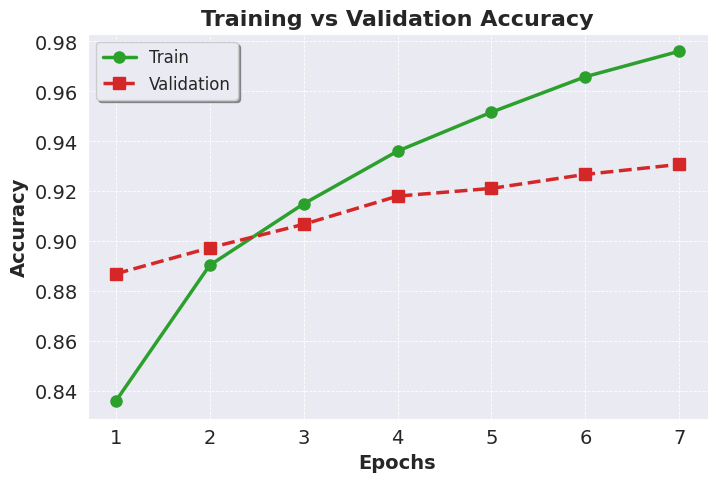

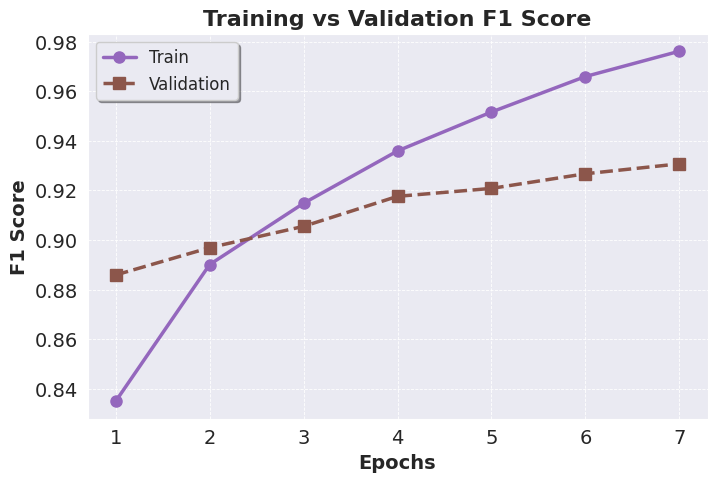

In [37]:
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

# Set seaborn style for professional-looking plots
sns.set_style("darkgrid")  
plt.rcParams.update({'font.size': 14, 'axes.labelweight': 'bold'})  # Enhance text visibility

# Extracted loss and accuracy values
epochs = np.array([1, 2, 3, 4, 5, 6, 7])
train_loss = np.array([0.4530, 0.2907, 0.2220, 0.1684, 0.1267, 0.0904, 0.0664])
valid_loss = np.array([0.3134, 0.2880, 0.2758, 0.2559, 0.2602, 0.2629, 0.2834])

train_acc = np.array([0.8360, 0.8904, 0.9150, 0.9361, 0.9517, 0.9659, 0.9761])
valid_acc = np.array([0.8870, 0.8974, 0.9068, 0.9181, 0.9212, 0.9268, 0.9308])

train_f1 = np.array([0.8350, 0.8901, 0.9148, 0.9359, 0.9516, 0.9659, 0.9761])
valid_f1 = np.array([0.8859, 0.8969, 0.9055, 0.9176, 0.9208, 0.9267, 0.9307])

# Function to create aesthetic plots
def plot_metrics(epochs, train_metric, valid_metric, title, ylabel, color1, color2):
    plt.figure(figsize=(8, 5))
    plt.plot(epochs, train_metric, marker='o', linestyle='-', linewidth=2.5, markersize=8, color=color1, label="Train")
    plt.plot(epochs, valid_metric, marker='s', linestyle='--', linewidth=2.5, markersize=8, color=color2, label="Validation")

    plt.title(title, fontsize=16, fontweight='bold')
    plt.xlabel("Epochs", fontsize=14)
    plt.ylabel(ylabel, fontsize=14)
    plt.xticks(epochs)
    
    plt.legend(fontsize=12, loc='best', frameon=True, fancybox=True, shadow=True)
    plt.grid(True, linestyle='--', linewidth=0.6)
    plt.show()

# Plot Loss
plot_metrics(epochs, train_loss, valid_loss, "Training vs Validation Loss", "Loss", "#1f77b4", "#ff7f0e")

# Plot Accuracy
plot_metrics(epochs, train_acc, valid_acc, "Training vs Validation Accuracy", "Accuracy", "#2ca02c", "#d62728")

# Plot F1 Score
plot_metrics(epochs, train_f1, valid_f1, "Training vs Validation F1 Score", "F1 Score", "#9467bd", "#8c564b")


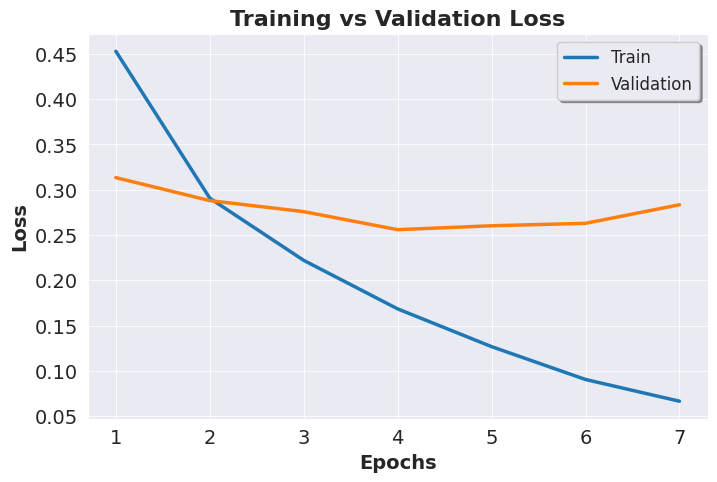

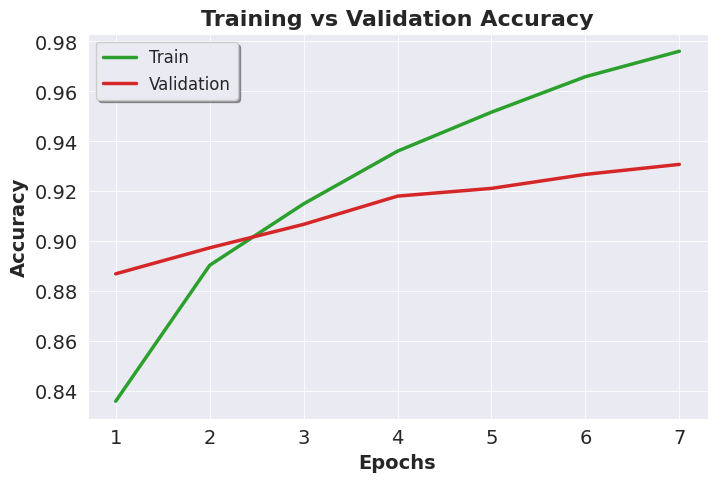

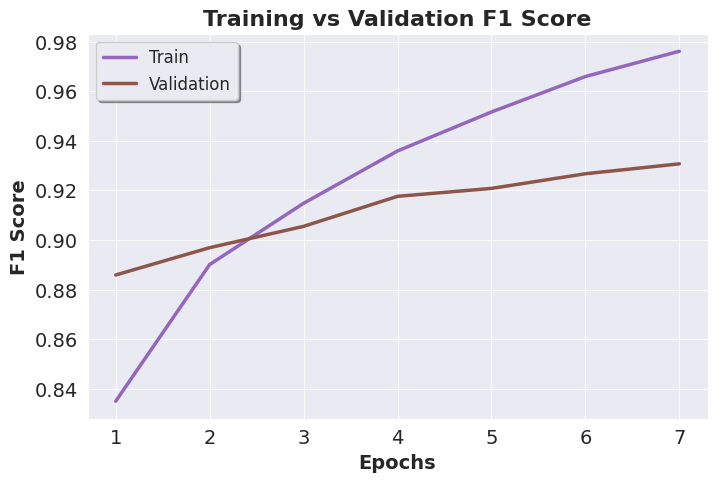

In [44]:
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

# Set seaborn style for professional-looking plots
sns.set_style("darkgrid")  
plt.rcParams.update({'font.size': 14, 'axes.labelweight': 'bold'})  # Enhance text visibility

# Extracted loss and accuracy values
epochs = np.array([1, 2, 3, 4, 5, 6, 7])
train_loss = np.array([0.4530, 0.2907, 0.2220, 0.1684, 0.1267, 0.0904, 0.0664])
valid_loss = np.array([0.3134, 0.2880, 0.2758, 0.2559, 0.2602, 0.2629, 0.2834])

train_acc = np.array([0.8360, 0.8904, 0.9150, 0.9361, 0.9517, 0.9659, 0.9761])
valid_acc = np.array([0.8870, 0.8974, 0.9068, 0.9181, 0.9212, 0.9268, 0.9308])

train_f1 = np.array([0.8350, 0.8901, 0.9148, 0.9359, 0.9516, 0.9659, 0.9761])
valid_f1 = np.array([0.8859, 0.8969, 0.9055, 0.9176, 0.9208, 0.9267, 0.9307])

# Function to create aesthetic plots
def plot_metrics(epochs, train_metric, valid_metric, title, ylabel, color1, color2):
    plt.figure(figsize=(8, 5))
    plt.plot(epochs, train_metric, linestyle='-', linewidth=2.5, color=color1, label="Train")
    plt.plot(epochs, valid_metric, linestyle='-', linewidth=2.5, color=color2, label="Validation")

    plt.title(title, fontsize=16, fontweight='bold')
    plt.xlabel("Epochs", fontsize=14)
    plt.ylabel(ylabel, fontsize=14)
    plt.xticks(epochs)
    
    plt.legend(fontsize=12, loc='best', frameon=True, fancybox=True, shadow=True)
    plt.grid(True, linestyle='-', linewidth=0.6)
    plt.show()

# Plot Loss
plot_metrics(epochs, train_loss, valid_loss, "Training vs Validation Loss", "Loss", "#1f77b4", "#ff7f0e")

# Plot Accuracy
plot_metrics(epochs, train_acc, valid_acc, "Training vs Validation Accuracy", "Accuracy", "#2ca02c", "#d62728")

# Plot F1 Score
plot_metrics(epochs, train_f1, valid_f1, "Training vs Validation F1 Score", "F1 Score", "#9467bd", "#8c564b")


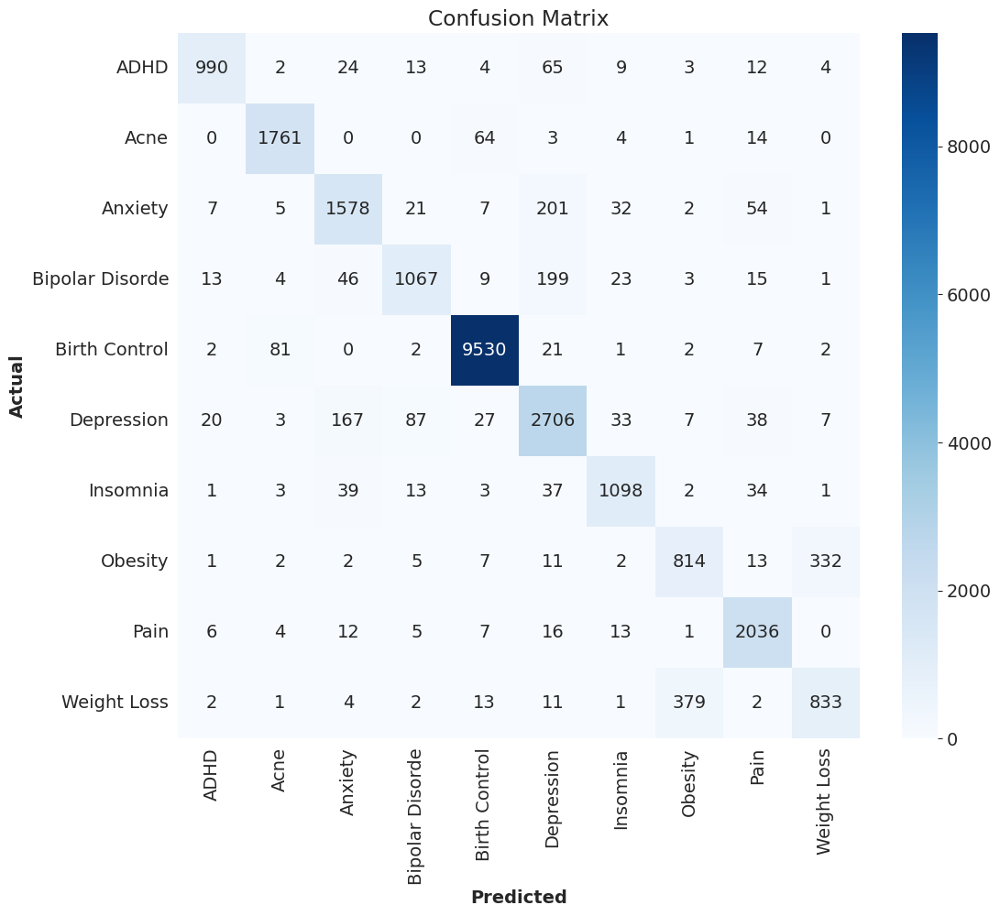

Accuracy: 0.9048
F1 Score: 0.9043
Recall: 0.9048
Precision: 0.9047


In [52]:
import torch
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import joblib  # ✅ For loading label_encoder.pkl
from transformers import RobertaTokenizer, RobertaForSequenceClassification
from sklearn.metrics import accuracy_score, f1_score, recall_score, precision_score, confusion_matrix
from torch.utils.data import Dataset, DataLoader

# ✅ Load train and test data
test_data = pd.read_csv("/kaggle/input/kuc-hackathon-winter-2018/drugsComTest_raw.csv")

# ✅ Load the saved label encoder
label_encoder = joblib.load("/kaggle/working/label_encoder.pkl")

# ✅ Ensure only known conditions are included
valid_conditions = list(label_encoder.classes_)  # Get classes from the saved encoder
test_data = test_data[test_data['condition'].isin(valid_conditions)].copy()

# ✅ Encode labels using the loaded label encoder
test_data['condition'] = test_data['condition'].apply(lambda x: label_encoder.transform([x])[0])

# ✅ Initialize RoBERTa tokenizer
tokenizer = RobertaTokenizer.from_pretrained("/kaggle/working/roberta-disease-classifier")

# ✅ Create Dataset class
class DrugReviewDataset(Dataset):
    def __init__(self, dataframe, tokenizer, max_len=256):
        self.data = dataframe
        self.texts = list(self.data['review'])
        self.labels = list(self.data['condition'])
        self.tokenizer = tokenizer
        self.max_len = max_len

    def __len__(self):
        return len(self.texts)

    def __getitem__(self, index):
        text = self.texts[index]
        label = self.labels[index]

        # Tokenize text
        encoded = self.tokenizer(
            text, 
            padding="max_length", 
            truncation=True, 
            max_length=self.max_len, 
            return_tensors="pt"
        )

        return {
            'input_ids': encoded['input_ids'].squeeze(0),  
            'attention_mask': encoded['attention_mask'].squeeze(0),
            'label': torch.tensor(label, dtype=torch.long)
        }

# ✅ Create DataLoader
batch_size = 16
test_dataset = DrugReviewDataset(test_data, tokenizer)
test_loader = DataLoader(test_dataset, batch_size=batch_size, shuffle=False)

# ✅ Load Pretrained Model
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model = RobertaForSequenceClassification.from_pretrained("/kaggle/working/roberta-disease-classifier")
model.to(device)

# ✅ Model evaluation function (WITH CONFUSION MATRIX)
def evaluate_model(model, dataloader, label_encoder):
    model.eval()
    all_preds, all_labels = [], []

    with torch.no_grad():
        for batch in dataloader:
            input_ids = batch['input_ids'].to(device)
            attention_mask = batch['attention_mask'].to(device)
            labels = batch['label'].to(device)

            # Forward pass
            outputs = model(input_ids=input_ids, attention_mask=attention_mask)
            preds = torch.argmax(outputs.logits, dim=1).cpu().numpy()
            
            all_preds.extend(preds)
            all_labels.extend(labels.cpu().numpy())

    # ✅ Compute evaluation metrics
    accuracy = accuracy_score(all_labels, all_preds)
    f1 = f1_score(all_labels, all_preds, average='weighted')
    recall = recall_score(all_labels, all_preds, average='weighted')
    precision = precision_score(all_labels, all_preds, average='weighted')

    # ✅ Confusion matrix
    cm = confusion_matrix(all_labels, all_preds)

    # ✅ Plot confusion matrix
    plt.figure(figsize=(12, 10))
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=label_encoder.classes_, yticklabels=label_encoder.classes_)
    plt.xlabel('Predicted')
    plt.ylabel('Actual')
    plt.title('Confusion Matrix')
    plt.show()

    return accuracy, f1, recall, precision, cm

# ✅ Evaluate the model
accuracy, f1, recall, precision, cm = evaluate_model(model, test_loader, label_encoder)

# ✅ Print metrics
print(f"Accuracy: {accuracy:.4f}")
print(f"F1 Score: {f1:.4f}")
print(f"Recall: {recall:.4f}")
print(f"Precision: {precision:.4f}")


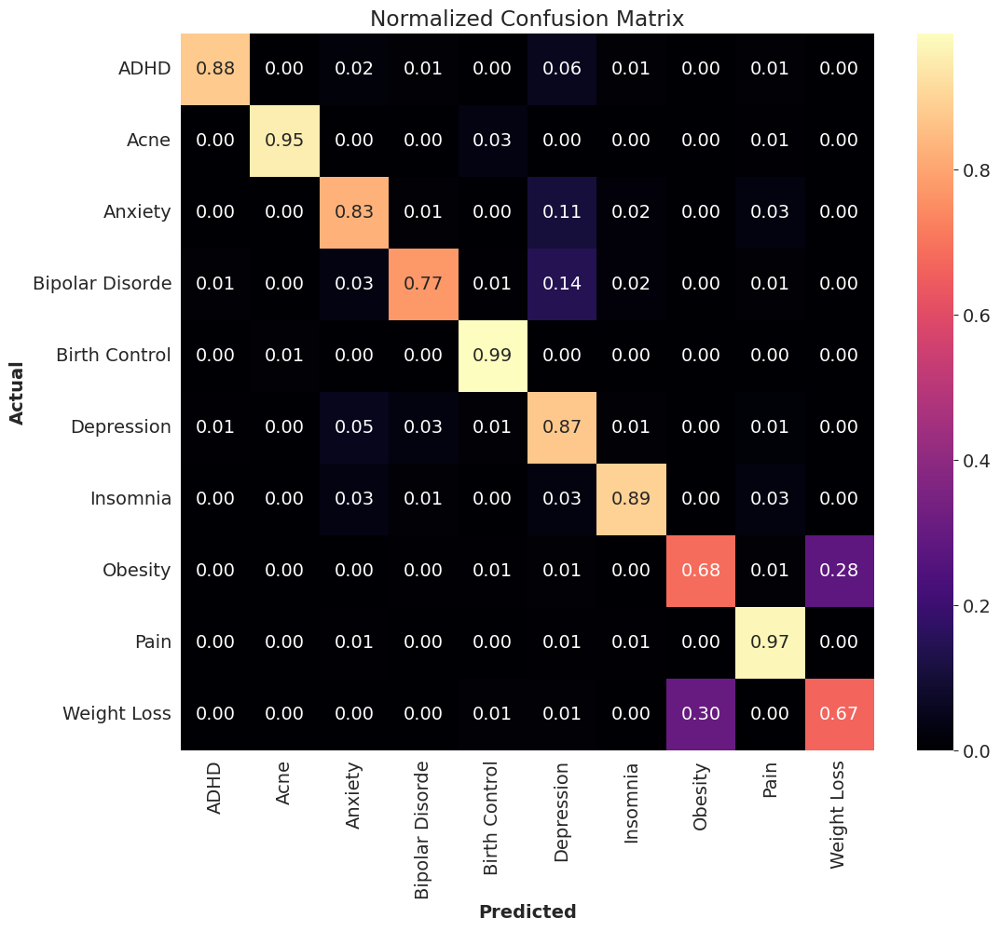

Accuracy: 0.9048
F1 Score: 0.9043
Recall: 0.9048
Precision: 0.9047


In [53]:
import torch
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import joblib  # ✅ For loading label_encoder.pkl
from transformers import RobertaTokenizer, RobertaForSequenceClassification
from sklearn.metrics import accuracy_score, f1_score, recall_score, precision_score, confusion_matrix
from torch.utils.data import Dataset, DataLoader

# ✅ Load test data
test_data = pd.read_csv("/kaggle/input/kuc-hackathon-winter-2018/drugsComTest_raw.csv")

# ✅ Load the saved label encoder
label_encoder = joblib.load("/kaggle/working/label_encoder.pkl")

# ✅ Ensure only known conditions are included
valid_conditions = list(label_encoder.classes_)  # Get classes from saved encoder
test_data = test_data[test_data['condition'].isin(valid_conditions)].copy()

# ✅ Encode labels using the loaded label encoder
test_data['condition'] = test_data['condition'].apply(lambda x: label_encoder.transform([x])[0])

# ✅ Load the tokenizer from the same directory as the model
tokenizer = RobertaTokenizer.from_pretrained("/kaggle/working/roberta-disease-classifier")

# ✅ Create Dataset class
class DrugReviewDataset(Dataset):
    def __init__(self, dataframe, tokenizer, max_len=256):
        self.data = dataframe
        self.texts = list(self.data['review'])
        self.labels = list(self.data['condition'])
        self.tokenizer = tokenizer
        self.max_len = max_len

    def __len__(self):
        return len(self.texts)

    def __getitem__(self, index):
        text = self.texts[index]
        label = self.labels[index]

        # Tokenize text
        encoded = self.tokenizer(
            text, 
            padding="max_length", 
            truncation=True, 
            max_length=self.max_len, 
            return_tensors="pt"
        )

        return {
            'input_ids': encoded['input_ids'].squeeze(0),  
            'attention_mask': encoded['attention_mask'].squeeze(0),
            'label': torch.tensor(label, dtype=torch.long)
        }

# ✅ Create DataLoader
batch_size = 16
test_dataset = DrugReviewDataset(test_data, tokenizer)
test_loader = DataLoader(test_dataset, batch_size=batch_size, shuffle=False)

# ✅ Load Pretrained Model
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model = RobertaForSequenceClassification.from_pretrained("/kaggle/working/roberta-disease-classifier")
model.to(device)

# ✅ Model evaluation function (WITH NORMALIZED CONFUSION MATRIX)
def evaluate_model(model, dataloader, label_encoder):
    model.eval()
    all_preds, all_labels = [], []

    with torch.no_grad():
        for batch in dataloader:
            input_ids = batch['input_ids'].to(device)
            attention_mask = batch['attention_mask'].to(device)
            labels = batch['label'].to(device)

            # Forward pass
            outputs = model(input_ids=input_ids, attention_mask=attention_mask)
            preds = torch.argmax(outputs.logits, dim=1).cpu().numpy()
            
            all_preds.extend(preds)
            all_labels.extend(labels.cpu().numpy())

    # ✅ Compute evaluation metrics
    accuracy = accuracy_score(all_labels, all_preds)
    f1 = f1_score(all_labels, all_preds, average='weighted')
    recall = recall_score(all_labels, all_preds, average='weighted')
    precision = precision_score(all_labels, all_preds, average='weighted')

    # ✅ Confusion matrix (Normalized)
    cm = confusion_matrix(all_labels, all_preds, normalize="true")  # Each row sums to 1

    # ✅ Plot confusion matrix (Research-friendly color: 'cividis')
    plt.figure(figsize=(12, 10))
    sns.heatmap(cm, annot=True, fmt=".2f", cmap="magma", xticklabels=label_encoder.classes_, yticklabels=label_encoder.classes_)
    plt.xlabel('Predicted')
    plt.ylabel('Actual')
    plt.title('Normalized Confusion Matrix')
    plt.show()

    return accuracy, f1, recall, precision, cm

# ✅ Evaluate the model
accuracy, f1, recall, precision, cm = evaluate_model(model, test_loader, label_encoder)

# ✅ Print metrics
print(f"Accuracy: {accuracy:.4f}")
print(f"F1 Score: {f1:.4f}")
print(f"Recall: {recall:.4f}")
print(f"Precision: {precision:.4f}")


In [57]:
import numpy as np


import joblib
from sklearn.preprocessing import LabelEncoder

# ✅ Load the saved label encoder
label_encoder = joblib.load("/kaggle/working/label_encoder.pkl")

# ✅ Ensure it's a LabelEncoder object
if not isinstance(label_encoder, LabelEncoder):
    raise TypeError("Loaded label_encoder is not a LabelEncoder object!")

# ✅ Extract class names
class_names = label_encoder.classes_

def evaluate_model(model, dataloader, label_encoder):
    model.eval()
    all_preds, all_labels = [], []

    with torch.no_grad():
        for batch in dataloader:
            input_ids = batch['input_ids'].to(device)
            attention_mask = batch['attention_mask'].to(device)
            labels = batch['label'].to(device)

            # Forward pass
            outputs = model(input_ids=input_ids, attention_mask=attention_mask)
            preds = torch.argmax(outputs.logits, dim=1).cpu().numpy()
            
            all_preds.extend(preds)
            all_labels.extend(labels.cpu().numpy())

    # ✅ Save predictions and labels
    np.save("/kaggle/working/all_preds.npy", np.array(all_preds))
    np.save("/kaggle/working/all_labels.npy", np.array(all_labels))

    # ✅ Compute evaluation metrics
    accuracy = accuracy_score(all_labels, all_preds)
    f1 = f1_score(all_labels, all_preds, average='weighted')
    recall = recall_score(all_labels, all_preds, average='weighted')
    precision = precision_score(all_labels, all_preds, average='weighted')

    # ✅ Confusion matrix (Normalized)
    cm = confusion_matrix(all_labels, all_preds, normalize="true")  # Each row sums to 1

    # ✅ Plot confusion matrix (Research-friendly color: 'magma')
    plt.figure(figsize=(12, 10))
    sns.heatmap(cm, annot=True, fmt=".2f", cmap="magma", xticklabels=class_names, yticklabels=class_names)
    plt.xlabel('Predicted')
    plt.ylabel('Actual')
    plt.title('Normalized Confusion Matrix')
    plt.show()

    return accuracy, f1, recall, precision, cm

# ✅ Run evaluation and save results
accuracy, f1, recall, precision, cm = evaluate_model(model, test_loader, label_encoder)

# ✅ Print metrics
print(f"Accuracy: {accuracy:.4f}")
print(f"F1 Score: {f1:.4f}")
print(f"Recall: {recall:.4f}")
print(f"Precision: {precision:.4f}")


AttributeError: 'numpy.ndarray' object has no attribute 'classes_'

<Figure size 1200x1000 with 0 Axes>

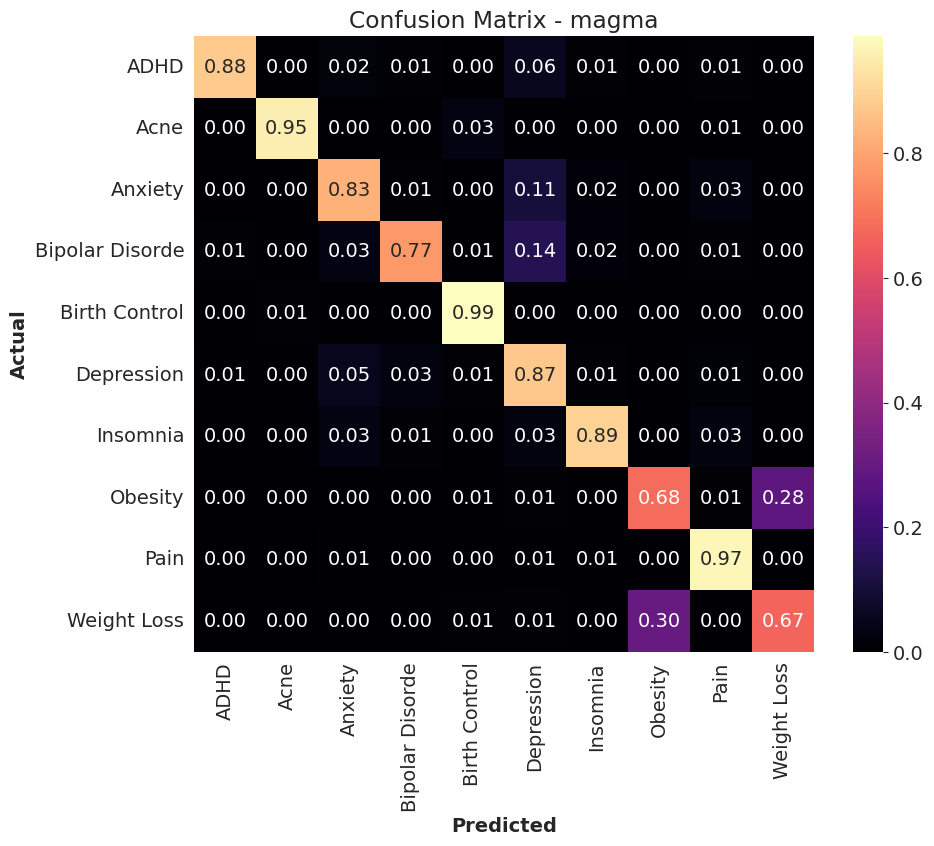

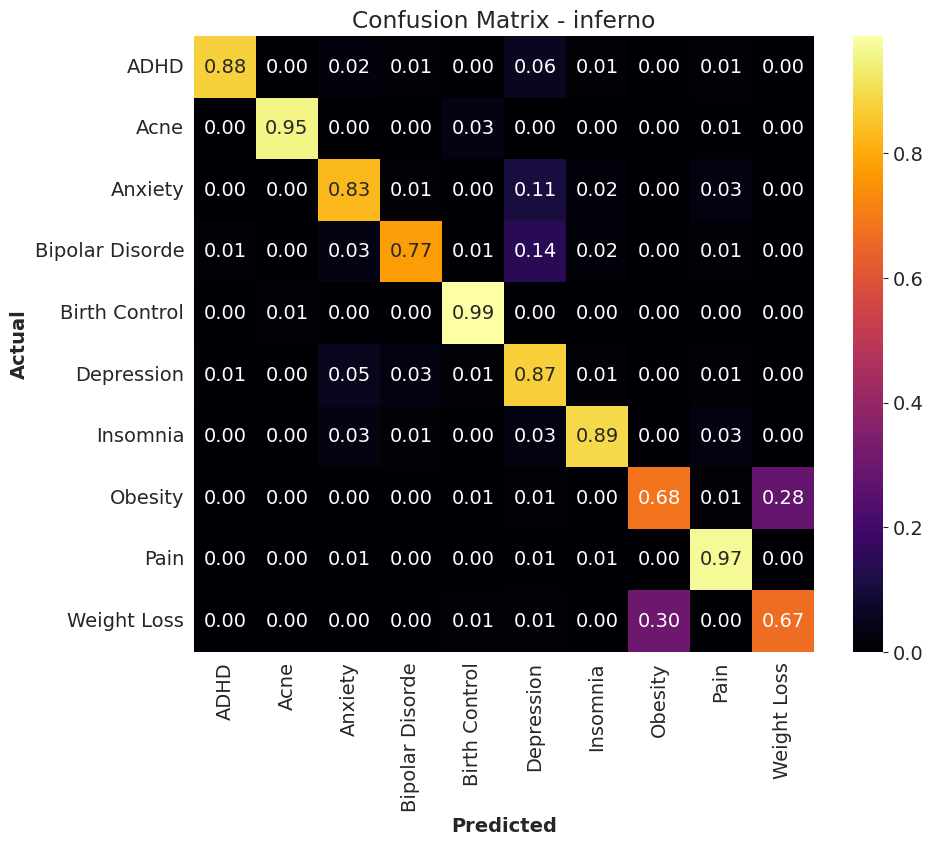

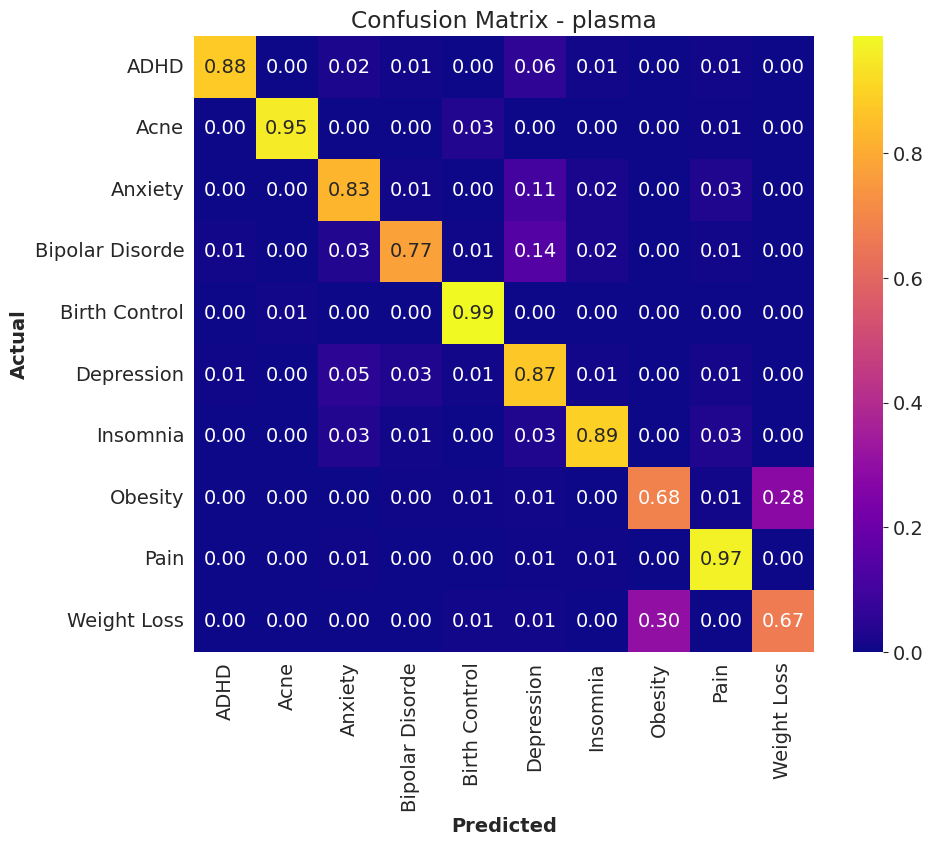

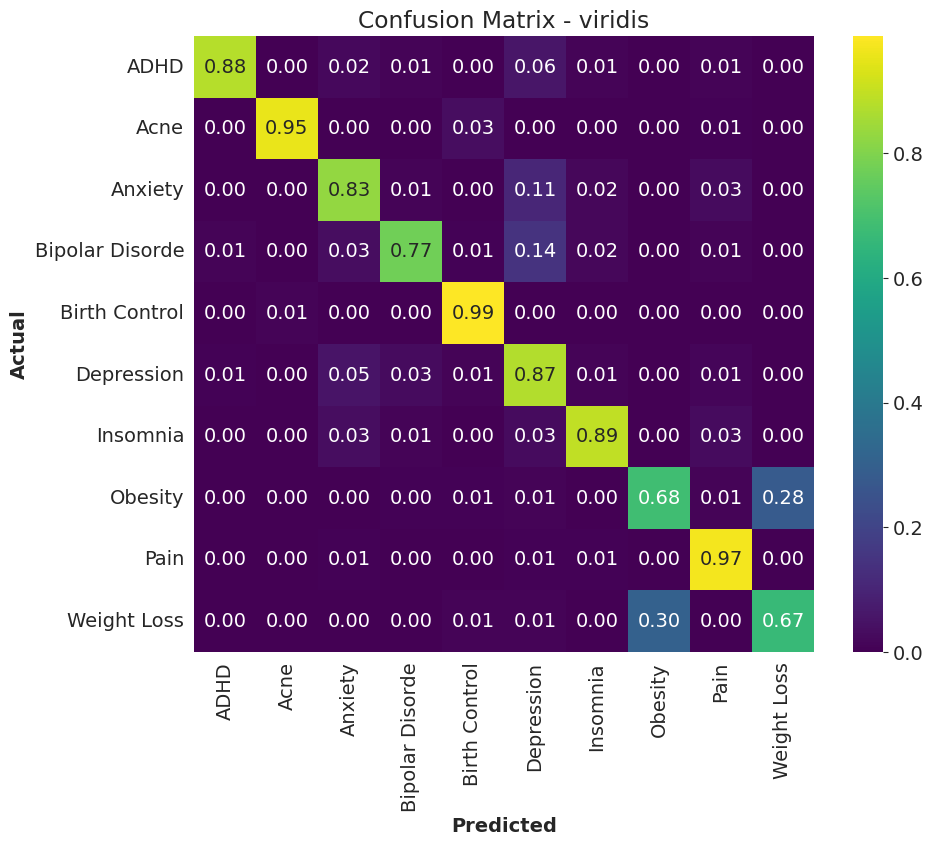

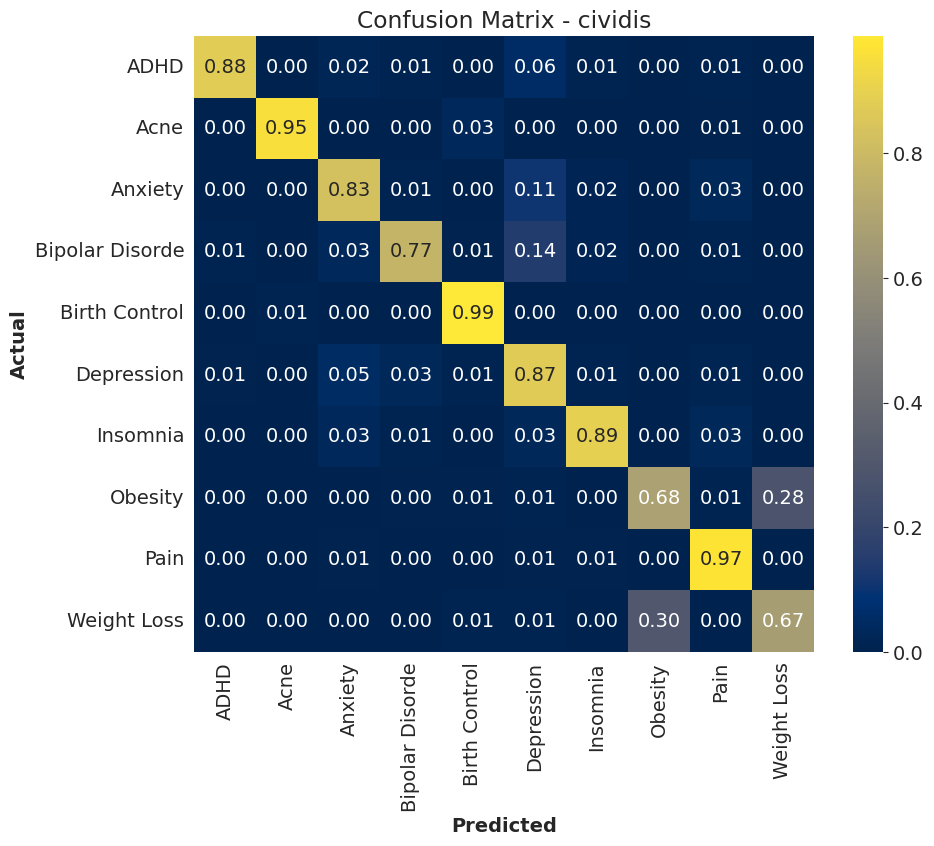

...

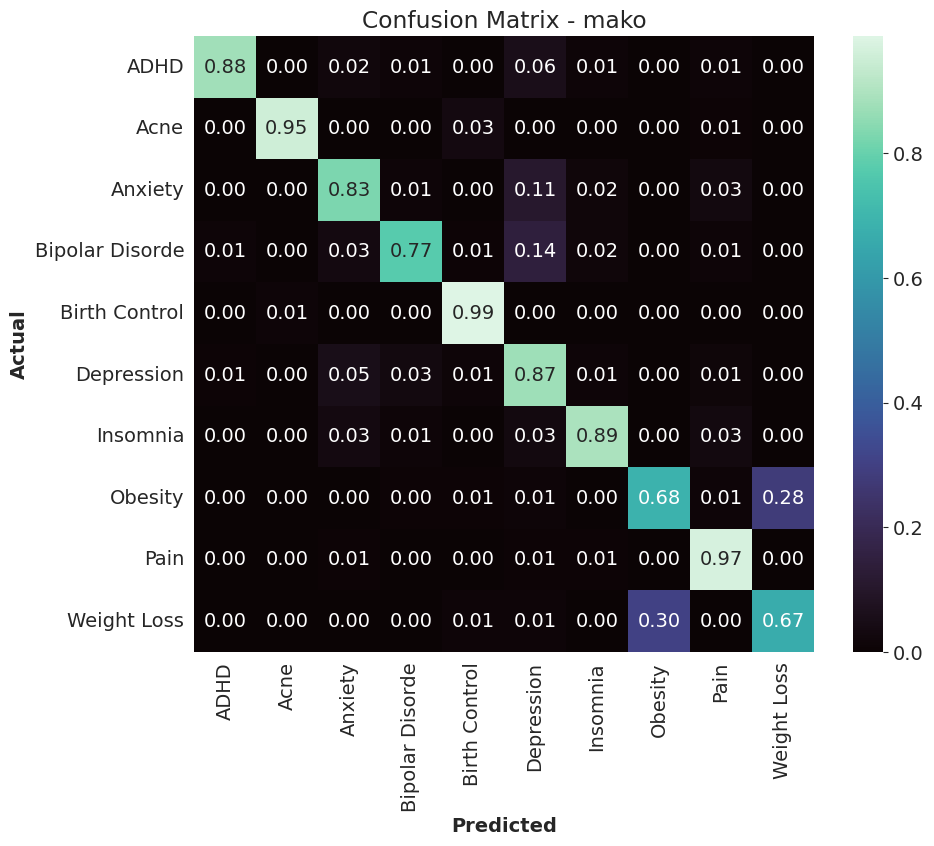

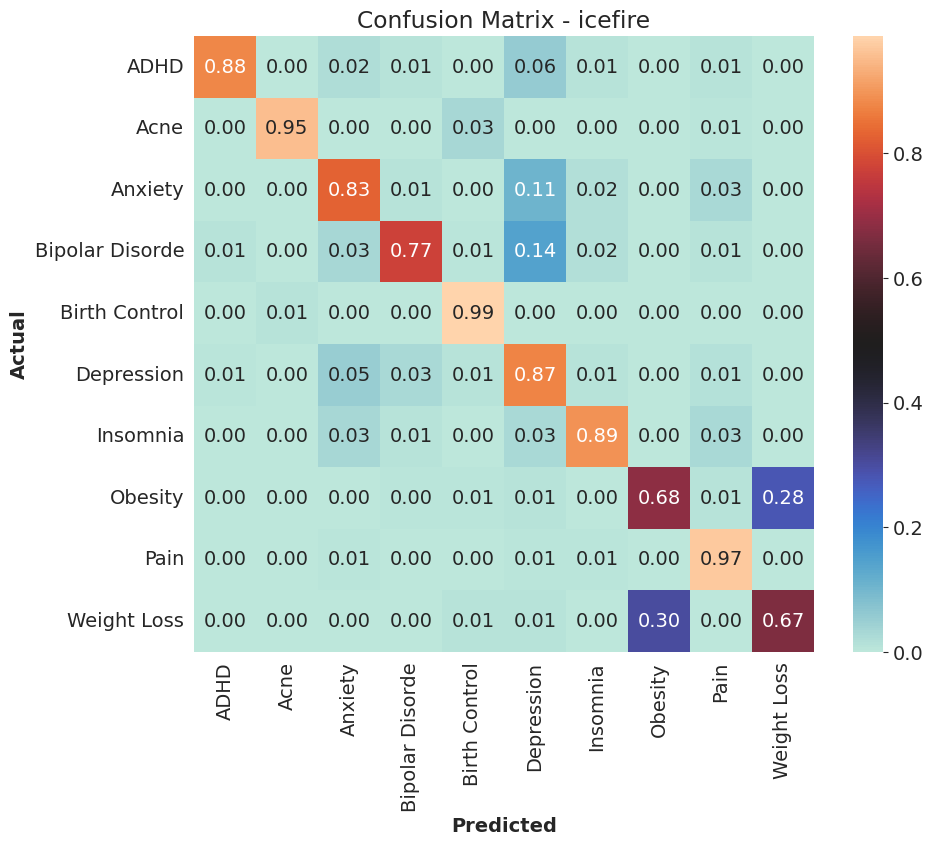

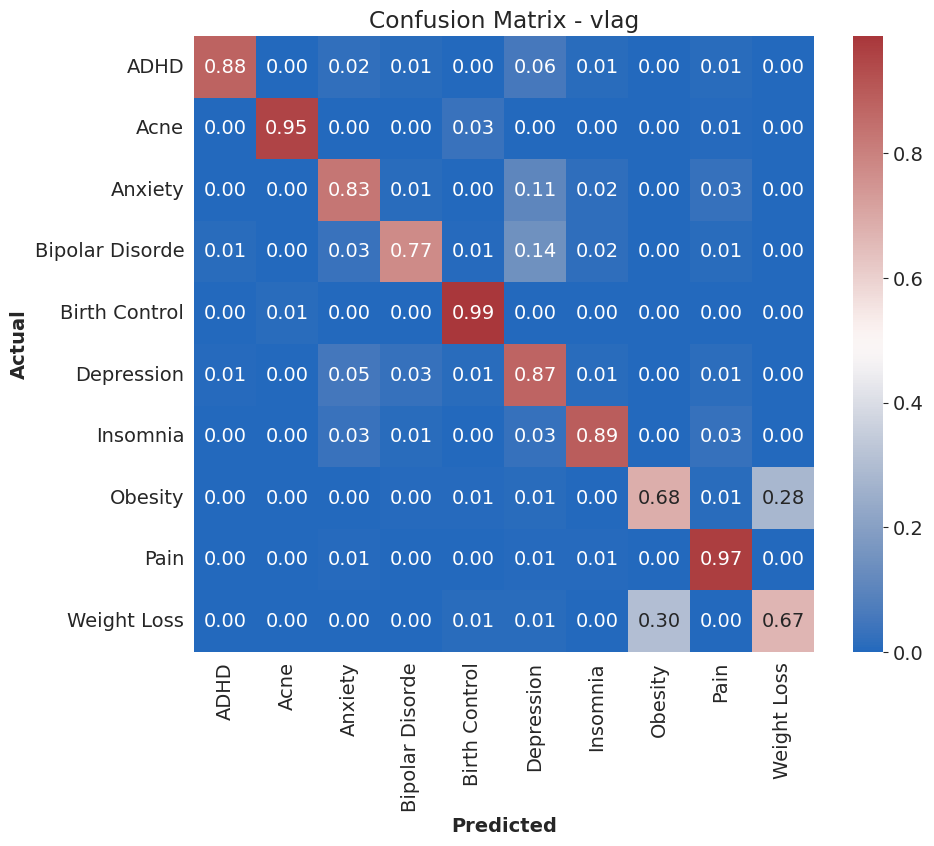

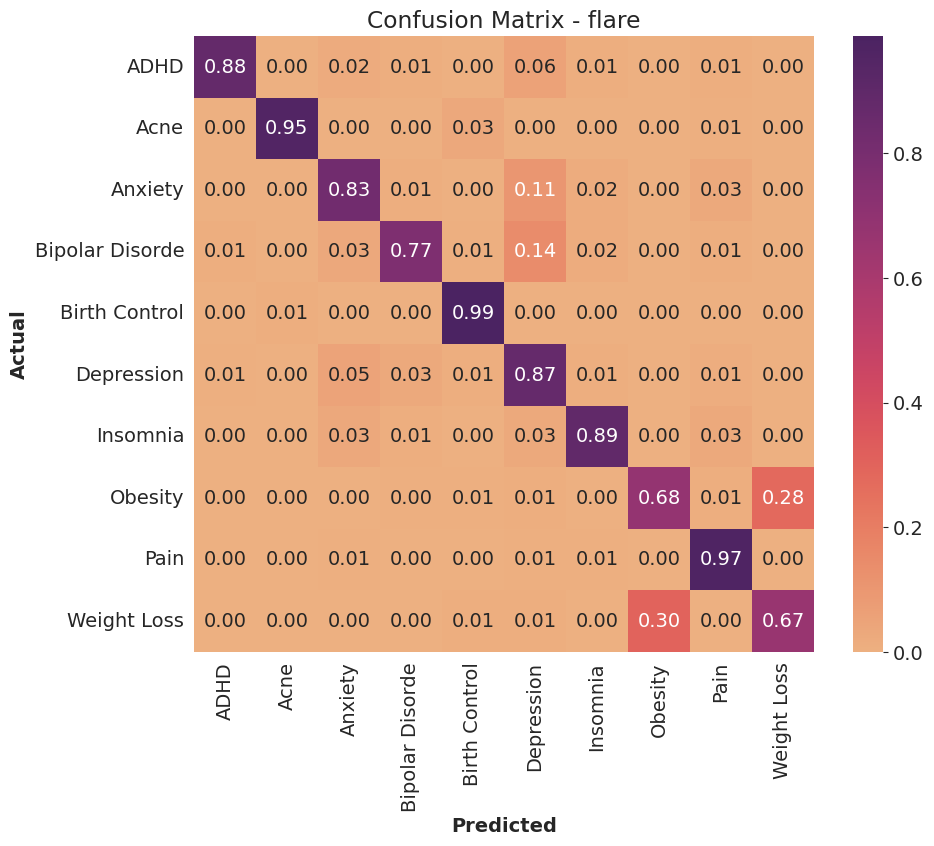

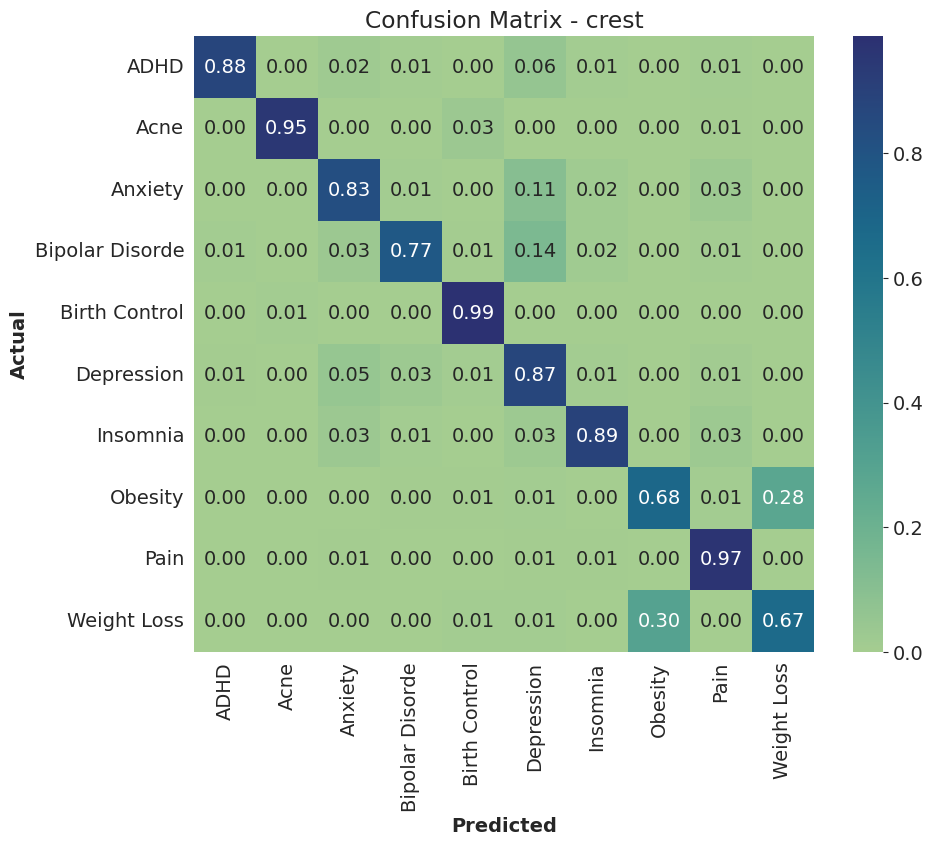

✅ All confusion matrices have been generated and saved!


In [59]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import joblib
from sklearn.metrics import confusion_matrix
import matplotlib.cm as cm

# ✅ Load saved predictions and labels
all_preds = np.load("/kaggle/working/all_preds.npy")
all_labels = np.load("/kaggle/working/all_labels.npy")

# ✅ Load the saved label encoder
label_encoder = joblib.load("/kaggle/working/label_encoder.pkl")

# ✅ Get all available colormaps
colormaps = [cmap for cmap in plt.colormaps() if not cmap.endswith("_r")]  # Exclude reversed versions

# ✅ Generate confusion matrices with different colormaps
for cmap in colormaps:
    cm_normalized = confusion_matrix(all_labels, all_preds, normalize="true")  # Normalize so rows sum to 1

    plt.figure(figsize=(10, 8))
    sns.heatmap(cm_normalized, annot=True, fmt=".2f", cmap=cmap, xticklabels=label_encoder.classes_, yticklabels=label_encoder.classes_)
    plt.xlabel('Predicted')
    plt.ylabel('Actual')
    plt.title(f'Confusion Matrix - {cmap}')
    plt.show()
    

print("✅ All confusion matrices have been generated and saved!")


In [62]:
!pip install torchinfo


import torch
from transformers import RobertaTokenizer
from torchinfo import summary

# ✅ Set device
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# ✅ Load model & tokenizer
tokenizer = RobertaTokenizer.from_pretrained("/kaggle/working/roberta-disease-classifier")
model = model.to(device)  # Move model to GPU if available

# ✅ Create a sample input
sample_text = "This is a sample input for the RoBERTa model."
encoded_input = tokenizer(
    sample_text,
    padding="max_length",
    truncation=True,
    max_length=256,
    return_tensors="pt"
)

# ✅ Move inputs to the same device as model
encoded_input = {key: value.to(device) for key, value in encoded_input.items()}

# ✅ Run summary
summary(model, input_data=encoded_input)


Layer (type:depth-idx)                                            Output Shape              Param #
RobertaForSequenceClassification                                  [1, 10]                   --
├─RobertaModel: 1-1                                               [1, 256, 768]             --
│    └─RobertaEmbeddings: 2-1                                     [1, 256, 768]             --
│    │    └─Embedding: 3-1                                        [1, 256, 768]             38,603,520
│    │    └─Embedding: 3-2                                        [1, 256, 768]             768
│    │    └─Embedding: 3-3                                        [1, 256, 768]             394,752
│    │    └─LayerNorm: 3-4                                        [1, 256, 768]             1,536
│    │    └─Dropout: 3-5                                          [1, 256, 768]             --
│    └─RobertaEncoder: 2-2                                        [1, 256, 768]             --
│    │    └─ModuleList: 3-6 